# 🌏 Global Earthquake Impact Visualization

このノートブックでは、USGS（アメリカ地質調査所）が公開している
最新1か月分の地震データを用いて、世界中で発生している地震の
位置・規模・深さを可視化する。

特にマグニチュードと地震の深さに注目し、
「どこで」「どの程度の影響を持つ地震」が起きているのかを探る。


In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# USGS 地震データ（直近1か月）
url = "https://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/all_month.csv"

df = pd.read_csv(url)

df.head()


,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2025-12-24T01:55:39.834Z,59.931000,-141.694000,2.80,2.50,ml,37.0,154.0,0.300000,1.00,...,2025-12-24T01:58:14.653Z,"118 km WNW of Yakutat, Alaska",earthquake,0.00,1.9908,0.300000,13.0,automatic,ak,ak
1,2025-12-24T01:39:59.090Z,38.835667,-122.799004,1.78,1.17,md,9.0,80.0,0.007296,0.01,...,2025-12-24T02:07:21.338Z,"7 km WNW of Cobb, CA",earthquake,0.42,1.0100,0.450000,10.0,automatic,nc,nc
2,2025-12-24T01:37:58.040Z,38.066502,-118.911499,17.65,2.00,md,11.0,133.0,0.282700,0.08,...,2025-12-24T01:52:20.230Z,"18 km SSE of Bodie, CA",earthquake,0.63,2.5100,0.420000,7.0,automatic,nc,nc
3,2025-12-24T01:35:05.250Z,33.146833,-116.545667,12.87,0.67,ml,26.0,91.0,0.078800,0.19,...,2025-12-24T01:38:42.913Z,"9 km NE of Julian, CA",earthquake,0.31,0.6000,0.180646,8.0,automatic,ci,ci
4,2025-12-24T01:26:05.191Z,62.317000,-151.760000,99.60,3.40,ml,98.0,49.0,0.400000,1.00,...,2025-12-24T01:48:26.040Z,"41 km NNW of Skwentna, Alaska",earthquake,0.00,2.9966,0.700000,2.0,automatic,ak,ak


In [2]:
# 必要な列を抽出
data = df[[
    "time",       # 発生時刻
    "latitude",   # 緯度
    "longitude",  # 経度
    "depth",      # 深さ (km)
    "mag",        # マグニチュード
    "place"       # 発生場所
]]

# 欠損値を除去
data = data.dropna()

data.describe()


,latitude,longitude,depth,mag
count,9646.000000,9646.000000,9646.000000,9646.000000
mean,41.166993,-113.711366,18.791621,1.725289
std,18.024198,62.383766,50.441012,1.238841
min,-63.894300,-179.963800,-3.390000,-1.310000
25%,33.819833,-140.072750,2.760000,0.860000
50%,38.820332,-122.774084,6.640000,1.550000
75%,59.967667,-116.443375,12.037500,2.300000
max,69.958200,179.980200,645.536000,7.600000


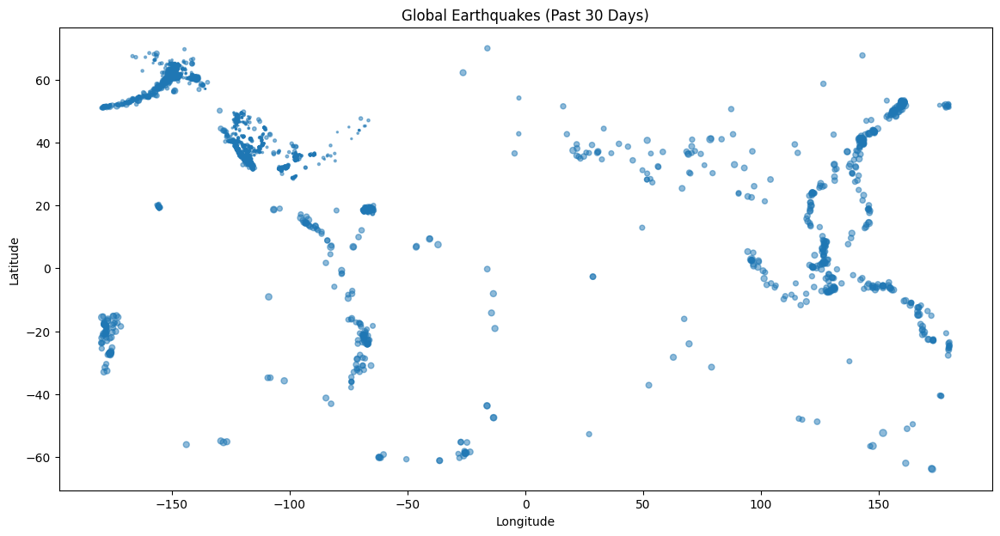

In [6]:
plt.figure(figsize=(14, 7))

# マグニチュードを点の大きさに反映
plt.scatter(
    data["longitude"],
    data["latitude"],
    s=data["mag"]**2,      # 影響感を出す
    alpha=0.5
)

plt.title("Global Earthquakes (Past 30 Days)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


点が大きい＝影響が大きい地震

世界中で「地震帯」が浮かび上がる

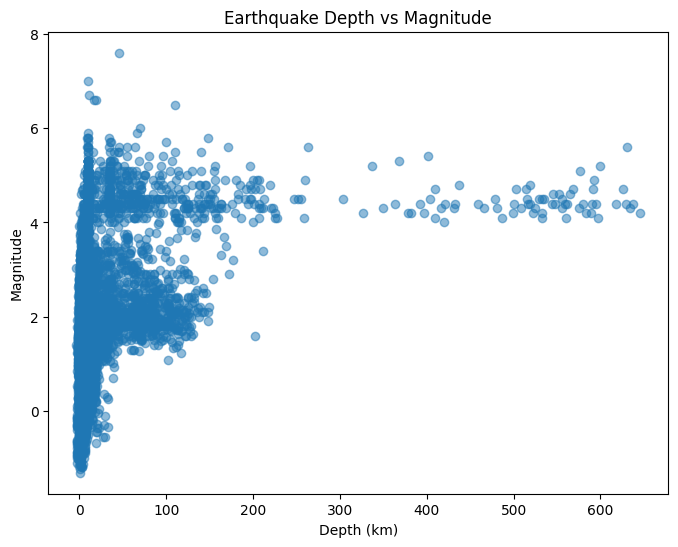

In [5]:
plt.figure(figsize=(8, 6))

plt.scatter(
    data["depth"],
    data["mag"],
    alpha=0.5
)

plt.xlabel("Depth (km)")
plt.ylabel("Magnitude")
plt.title("Earthquake Depth vs Magnitude")
plt.show()


### 日本語サマリー

本課題では、USGSが公開している最新1か月分の地震データを取得し、
世界中で発生している地震の分布と影響を可視化した。
経度・緯度を用いた散布図では、地震が特定の地域に集中して発生している
様子がはっきりと分かり、特に環太平洋地域に地震が多いことを再確認できた。

また、マグニチュードを点の大きさで表現することで、
一目で影響の大きな地震を把握できる可視化になった。
さらに深さとマグニチュードの関係を分析することで、
必ずしも深い地震が大きな規模になるわけではないことが分かり、
地震の複雑さを実感した。
データを可視化することで、数字だけでは見えない
「影響」を直感的に理解できると感じた。


In [7]:
!pip install folium


'pip' �́A�����R�}���h�܂��͊O���R�}���h�A
����\�ȃv���O�����܂��̓o�b�` �t�@�C���Ƃ��ĔF������Ă��܂���B


In [8]:
import folium
import pandas as pd

url = "https://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/all_month.csv"
df = pd.read_csv(url)

data = df[["latitude", "longitude", "mag", "depth", "place"]].dropna()


In [9]:
# 世界中心の地図
m = folium.Map(location=[0, 0], zoom_start=2, tiles="CartoDB positron")


In [10]:
for _, row in data.iterrows():
    # マグニチュードによる色分け
    if row["mag"] >= 6:
        color = "red"
    elif row["mag"] >= 4:
        color = "orange"
    else:
        color = "blue"

    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=row["mag"] * 2,   # 影響の大きさ
        color=color,
        fill=True,
        fill_opacity=0.6,
        popup=f"""
        <b>Location:</b> {row['place']}<br>
        <b>Magnitude:</b> {row['mag']}<br>
        <b>Depth:</b> {row['depth']} km
        """
    ).add_to(m)


In [11]:
m


### 可視化の意図

Foliumを用いて、地震を実際の世界地図上に表示した。
円の大きさはマグニチュードを、色は地震の規模を表しており、
一目で影響の大きな地震がどこで起きているか分かるようにした。

特に環太平洋地域に大きな地震が集中していることが視覚的に理解でき、
データが持つ「Impact」を強く感じることができた。
